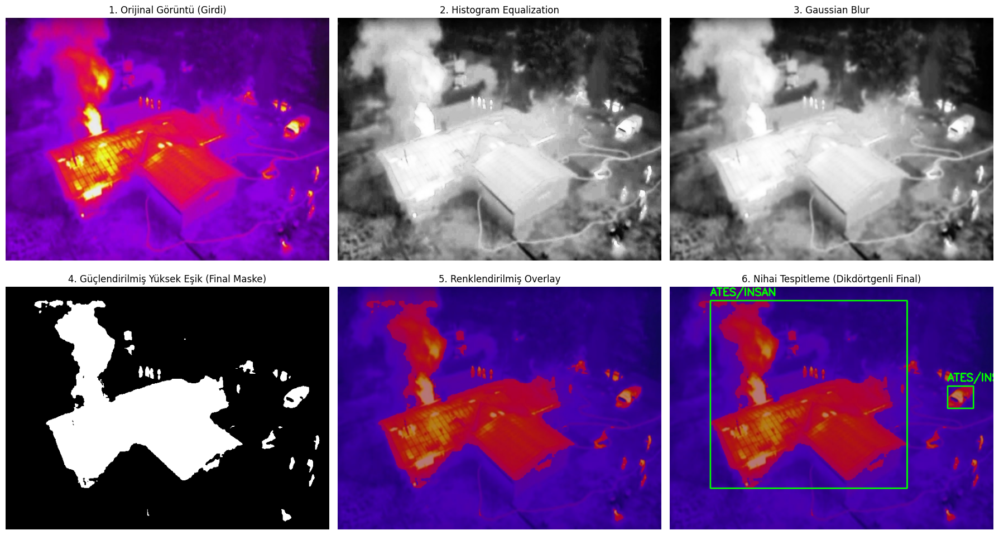

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

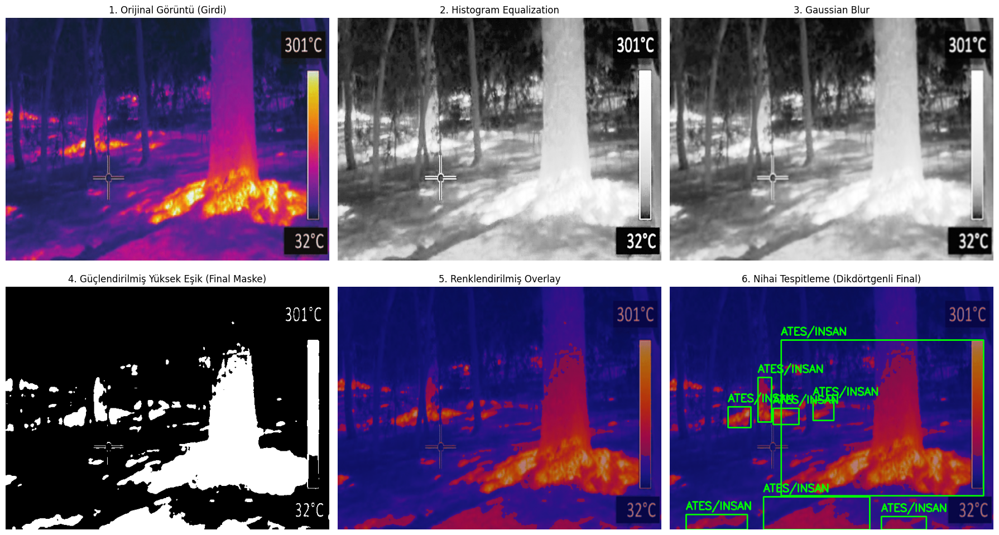

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire3.png')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

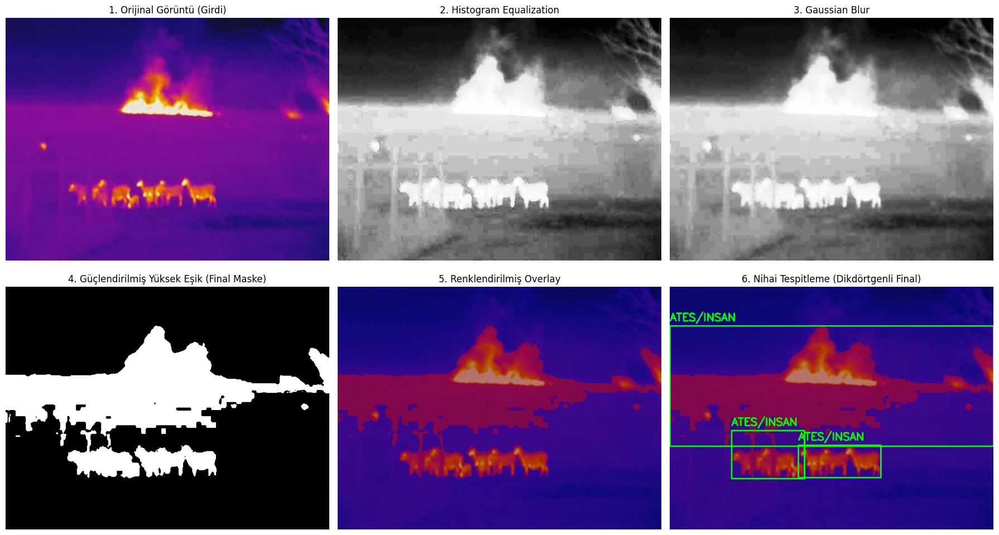

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire4.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

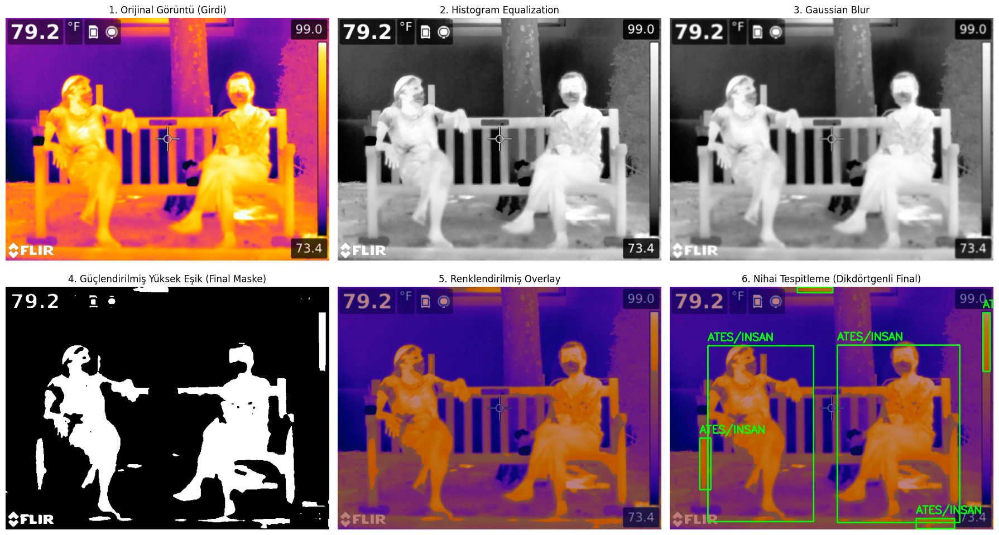

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire5.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

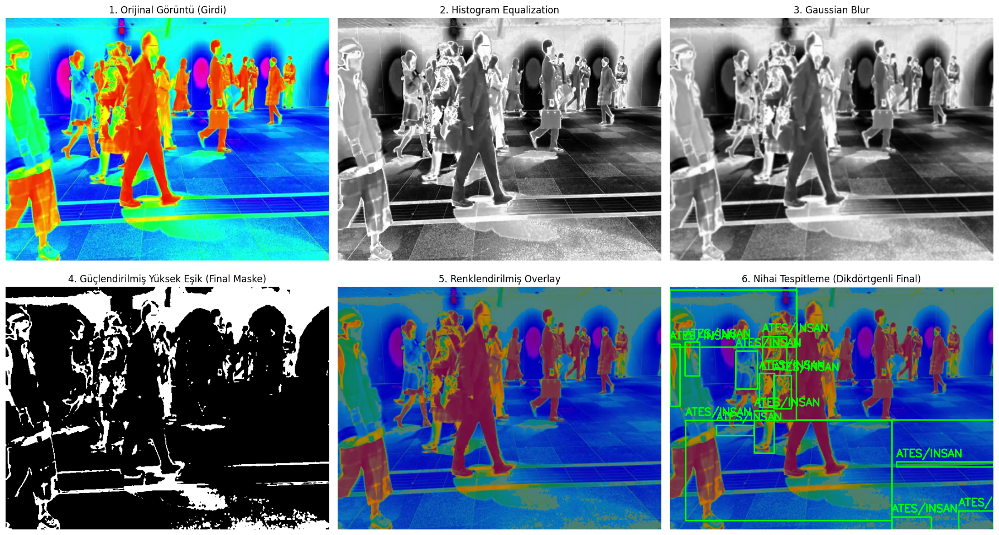

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire6.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

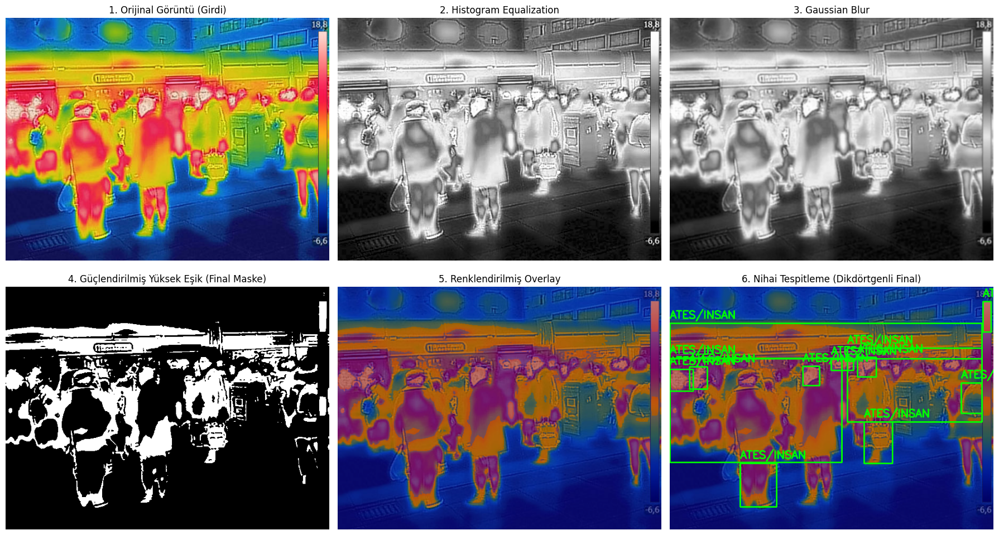

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire7.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

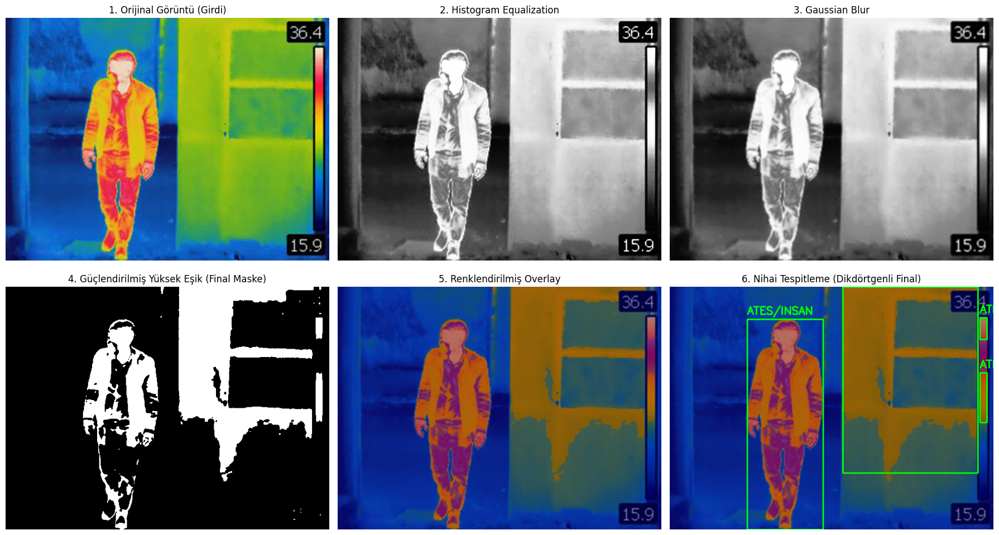

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire8.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

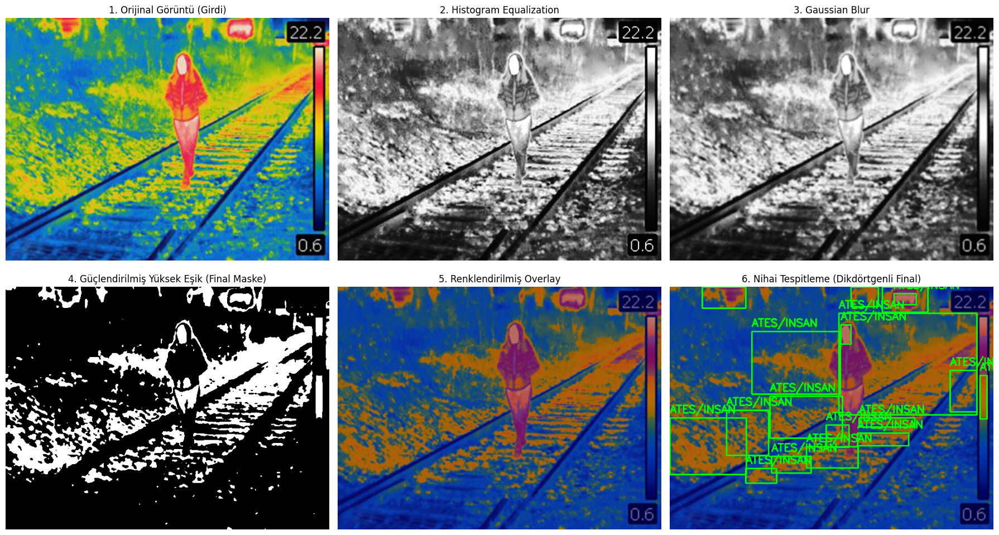

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire9.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

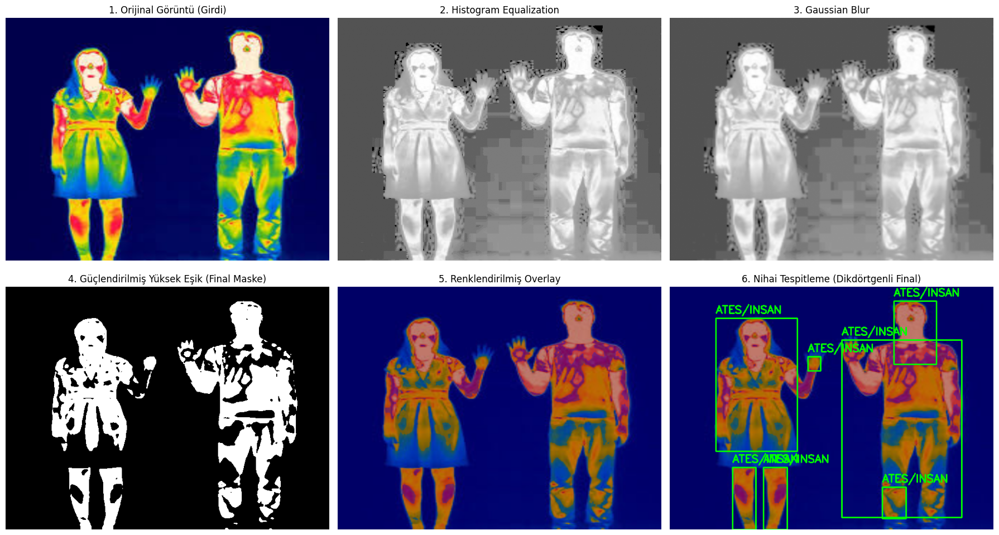

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire10.jpeg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()

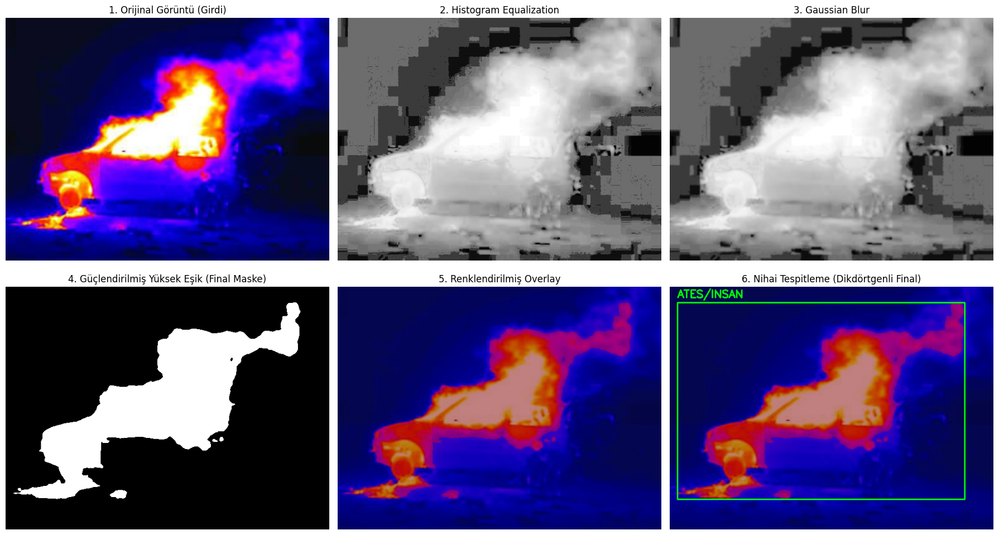

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Görüntü Yükleme ve Hazırlık ---
img = cv2.imread('thermal_fire1.jpg')

if img is None:
    print("Hata: 'thermal_fire.jpg' dosyası yüklenemedi. Dosya adını ve yolunu kontrol edin.")
    exit()

img = cv2.resize(img, (640, 480))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. YÖNTEM: Histogram Equalization (Kontrast Artırma) ---
equalized = cv2.equalizeHist(gray)

# --- 3. YÖNTEM: Gaussian Blur (Gürültü Azaltma) ---
blurred = cv2.GaussianBlur(equalized, (5, 5), 0)

# --- 4. YÖNTEM: Güçlendirilmiş Yüksek Eşikleme ---
THRESH_VALUE_STRONG = 200 
# Yöntem 5 olan Morfolojik Açma bu adımdan sonra uygulanmayacak.
final_mask = cv2.threshold(blurred, THRESH_VALUE_STRONG, 255, cv2.THRESH_BINARY)[1] 


# --- 5. Ara Sonuç: Renklendirilmiş Overlay Görüntü ---
# Artık final_mask'ı renklendiriyoruz
thresh_color = cv2.applyColorMap(final_mask, cv2.COLORMAP_JET)
overlay_img = img.copy()
alpha = 0.5  # Şeffaflık
cv2.addWeighted(thresh_color, alpha, overlay_img, 1 - alpha, 0, overlay_img)
overlay_rgb = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)


# --- 6. Nihai İşlem: Kontur Bulma ve Dikdörtgen Çizimi ---
final_result_img = overlay_rgb.copy() 

# Konturları bulma (Doğrudan eşiklenmiş maske üzerinden)
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

min_area = 500 # Gürültü filtreleme

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Renklendirilmiş final resmin üzerine dikdörtgen çiz (Yeşil)
        cv2.rectangle(final_result_img, (x, y), (x + w, y + h), (0, 255, 0), 2) 
        
        label = "ATES/INSAN"
        cv2.putText(final_result_img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


# --- 7. Sonuçları Göster (6 Ara Çıktı) ---
plt.figure(figsize=(18, 10)) 

# 1. Sıra: Temel Giriş ve Ön İşlemler
plt.subplot(2, 3, 1)
plt.title("1. Orijinal Görüntü (Girdi)")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("2. Histogram Equalization")
plt.imshow(equalized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("3. Gaussian Blur")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

# 2. Sıra: Tespit ve Sonuç
plt.subplot(2, 3, 4)
plt.title(f"4. Güçlendirilmiş Yüksek Eşik (Final Maske)")
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title("5. Renklendirilmiş Overlay")
plt.imshow(overlay_rgb)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title("6. Nihai Tespitleme (Dikdörtgenli Final)")
plt.imshow(final_result_img)
plt.axis('off')

plt.tight_layout()
plt.show()